## Problem Statment : Predict Wildfire Occurrence Using Meteorological and Environmental Data
Submitted by: Ajay Sonawane 

In [1]:
##Load Library

In [49]:
import pandas as pd
import numpy as np
import ast
from IPython.display import clear_output
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import warnings

warnings.filterwarnings('ignore')
%matplotlib inline

In [109]:
import datetime
import time

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics

from xgboost import XGBRegressor



from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.metrics import RocCurveDisplay


### Load Dataset

In [3]:
fire = pd.read_csv("raw_fires.csv")

In [5]:
fire.head(5)

,OBJECTID,YEAR_,STATE,AGENCY,UNIT_ID,FIRE_NAME,INC_NUM,ALARM_DATE,CONT_DATE,CAUSE,COMMENTS,REPORT_AC,GIS_ACRES,C_METHOD,OBJECTIVE,FIRE_NUM,SHAPE_Length,SHAPE_Area
0,21440,2020.0,CA,CDF,NEU,NELSON,00013212,2020/06/18 00:00:00+00,2020/06/23 00:00:00+00,11.0,NaN,110.0,109.60250,1.0,1.0,NaN,4179.743142,7.331347e+05
1,21441,2020.0,CA,CDF,NEU,AMORUSO,00011799,2020/06/01 00:00:00+00,2020/06/04 00:00:00+00,2.0,NaN,670.0,685.58502,1.0,1.0,NaN,12399.375391,4.578172e+06
2,21442,2020.0,CA,CDF,NEU,ATHENS,00018493,2020/08/10 00:00:00+00,2020/03/01 00:00:00+00,14.0,NaN,26.0,27.30048,1.0,1.0,NaN,2119.194120,1.823876e+05
3,21443,2020.0,CA,CDF,NEU,FLEMING,00007619,2020/03/31 00:00:00+00,2020/04/01 00:00:00+00,9.0,NaN,13.0,12.93155,1.0,1.0,NaN,2029.524881,8.667942e+04
4,21444,2020.0,CA,CDF,NEU,MELANESE,00008471,2020/04/14 00:00:00+00,2020/04/19 00:00:00+00,18.0,NaN,10.3,10.31596,1.0,1.0,NaN,1342.742903,7.017912e+04


In [6]:
fire.shape

(21318, 18)

## Processing and Cleaning Fire Data

The fire data includes a feature called UNIT_ID, which is very similar to county, but not exactly the same because two counties are occasionally grouped together in the same unit. Additionally, the abbreviations used in UNIT_ID are not the same as the standard three letter abbreviations used elsewhere to identify California counties. So, a dictionary mapping these abbreviations to county names had to be manually constructed.

In [7]:
county_dict = {'NEU' : 'Yuba', 'BTU': 'Butte', 'CZU': 'San Mateo - Santa Cruz', 'MEU': 'Mendocino', 'HUU': 'Humboldt', 'TGU': 'Tehama - Glenn', 'ORC': 'Orange County', 'SKU': 'Siskiyou', 'TCU': 'Tuolumne - Calaveras',
       'KRN': 'Kern', 'CND': 'Kern', 'MMU': 'Madera - Mariposa', 'SHF': 'Trinity', 'SHU': 'Shasta - Trinity', 'SBC': 'Santa Barbara', 'BDU': 'San Bernardino', 'SLU': 'San Luis Obispo', 'TUU': 'Tulare', 
       'AEU': 'Amador - El Dorado', 'FKU': 'Fresno - Kings', 'BEU': 'Monterey - San Benito', 'VNC': 'Ventura', 'SCU': 'Santa Clara', 'MVU': 'San Diego', 'RRU': 'Riverside', 'LAC': 'Los Angeles', 'ANF': 'Los Angeles',
       'LNU': 'Sonoma Lake - Napa', 'MRN': 'Marin', 'MCP': 'San Diego', 'INF': 'Inyo', 'MDF': 'Modoc', 'TNF': 'Yuba', 'PNF': 'Plumas', 'LPF': 'Santa Barbara', 'KNF': 'Siksiyou',
       'SQF': 'Fresno', 'ENF': 'El Dorado', 'SNF': 'Mariposa', 'HIA': 'Humboldt', 'MNF': 'Lake', 'STF': 'Tuolumne', 'BDF': 'San Bernadino', 'CNF': 'San Diego', 'MNP': 'San Bernardino',
       'LNF': 'Lassen', 'CDD': 'Riverside', 'LMU': 'Lassen - Modoc', 'SRF': 'Del Norte', 'HTF': 'Humboldt', 'YNP': 'Mariposa', 'BNP': 'Siskiyou', 'KNP': 'Tulare', 'CNP': 'Ventura',
       'RNP': 'Marin', 'CCD': 'Los Angeles', 'NOD': 'Shasta', 'BBD': 'Kern', 'TMU': 'Placer', 'TOI': 'Mono', 'SNU': 'Sonoma', 'DVP': 'Inyo',
       'AFV': 'Santa Barbara', 'CRB': 'San Luis Obispo', 'SMP': 'Los Angeles', 'LDF': 'Los Angeles', 'FNF': 'Klamath', 'WED': 'Siskiyou', 'KRR': 'Kern',
       'SWR': 'Sacramento', 'LUR': 'Merced', 'BRR': 'Kern', 'HPR': 'Ventura', 'PLR': 'Tulare', 'SOR': 'Imperial', 'TNR': 'San Diego', 'SJR': 'San Joaquin', 'CLR': 'Modoc',
       'LKR': 'Klamath', 'RWP': 'Humboldt', 'LNP': 'Lassen', 'JTP': 'Riverside', 'GNP': 'Marin', 'PIP': 'San Benito', 'VLJ': 'Solano', 'RRS': 'Siskiyou'}

In [8]:
fire['UNIT_ID'] = fire['UNIT_ID'].map(county_dict)

In [9]:
fire['ALARM_DATE'] = pd.to_datetime(fire.ALARM_DATE, errors = 'coerce')
fire_recent = fire.loc[fire.ALARM_DATE > '2008-07-01', :]
fire_recent.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4304 entries, 0 to 21317
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   OBJECTID      4304 non-null   int64              
 1   YEAR_         4304 non-null   float64            
 2   STATE         4301 non-null   object             
 3   AGENCY        4299 non-null   object             
 4   UNIT_ID       4279 non-null   object             
 5   FIRE_NAME     4287 non-null   object             
 6   INC_NUM       4078 non-null   object             
 7   ALARM_DATE    4304 non-null   datetime64[ns, UTC]
 8   CONT_DATE     4249 non-null   object             
 9   CAUSE         4273 non-null   float64            
 10  COMMENTS      2052 non-null   object             
 11  REPORT_AC     3659 non-null   float64            
 12  GIS_ACRES     4297 non-null   float64            
 13  C_METHOD      4293 non-null   float64            
 14  OBJECTIVE   

From this data we only need the size of the fire, when it occurred, it's cause, and where it is located, so everything else is dropped.

Where the UNIT_ID contained two counties we arbitrarily select the second so that we will not have merge issues when we join this data to the weather data.

In [10]:
fire_recent.head()

,OBJECTID,YEAR_,STATE,AGENCY,UNIT_ID,FIRE_NAME,INC_NUM,ALARM_DATE,CONT_DATE,CAUSE,COMMENTS,REPORT_AC,GIS_ACRES,C_METHOD,OBJECTIVE,FIRE_NUM,SHAPE_Length,SHAPE_Area
0,21440,2020.0,CA,CDF,Yuba,NELSON,00013212,2020-06-18 00:00:00+00:00,2020/06/23 00:00:00+00,11.0,NaN,110.0,109.60250,1.0,1.0,NaN,4179.743142,7.331347e+05
1,21441,2020.0,CA,CDF,Yuba,AMORUSO,00011799,2020-06-01 00:00:00+00:00,2020/06/04 00:00:00+00,2.0,NaN,670.0,685.58502,1.0,1.0,NaN,12399.375391,4.578172e+06
2,21442,2020.0,CA,CDF,Yuba,ATHENS,00018493,2020-08-10 00:00:00+00:00,2020/03/01 00:00:00+00,14.0,NaN,26.0,27.30048,1.0,1.0,NaN,2119.194120,1.823876e+05
3,21443,2020.0,CA,CDF,Yuba,FLEMING,00007619,2020-03-31 00:00:00+00:00,2020/04/01 00:00:00+00,9.0,NaN,13.0,12.93155,1.0,1.0,NaN,2029.524881,8.667942e+04
4,21444,2020.0,CA,CDF,Yuba,MELANESE,00008471,2020-04-14 00:00:00+00:00,2020/04/19 00:00:00+00,18.0,NaN,10.3,10.31596,1.0,1.0,NaN,1342.742903,7.017912e+04


In [11]:
fire_recent.to_csv('fire_data.csv', index = False)

## Processing and Cleaning Weather Data

Import the California county data in order add county information to the weather data.

In [12]:
weather = pd.read_csv('clean_daily_weather.csv')
counties_long = pd.read_csv('CA_Counties_Location.csv')
counties = counties_long[['NAMELSAD', 'INTPTLAT', 'INTPTLON']]
counties.rename(columns = {'NAMELSAD': 'name', 'INTPTLAT': 'lat', 'INTPTLON': 'lon'}, inplace = True)
counties.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_2600\170899076.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counties.rename(columns = {'NAMELSAD': 'name', 'INTPTLAT': 'lat', 'INTPTLON': 'lon'}, inplace = True)


,name,lat,lon
0,Sierra County,39.576925,-120.521993
1,Sacramento County,38.450011,-121.340441
2,Santa Barbara County,34.537057,-120.039973
3,Calaveras County,38.183900,-120.561442
4,Ventura County,34.358742,-119.133143


Merge the county data to the weather data using latitude and longitude.

In [13]:
counties = counties.round(2)
w_c = pd.merge(weather, counties, left_on = ['lat', 'long'], right_on = ['lat', 'lon'])
w_c.drop(columns = ['lon'], inplace = True)

At this point our weather data has information for every day of every month of every year since July 1, 2008 in every county in California. This data is too granular for our model, so we apply a county and date mask to the dataframe for every combination of day and county in order to find monthly average for all of our weather statistics. Then this data is appended to a new data frame named out.

In [43]:
weather = pd.read_csv('weather_data.csv')
weather['date'] = pd.to_datetime(weather.date)
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8700 entries, 0 to 8699
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          8700 non-null   datetime64[ns]
 1   county        8700 non-null   object        
 2   maxtempF      8700 non-null   float64       
 3   mintempF      8700 non-null   float64       
 4   avgtempF      8700 non-null   float64       
 5   totalSnow_cm  8700 non-null   float64       
 6   humid         8700 non-null   float64       
 7   wind          8700 non-null   float64       
 8   precip        8700 non-null   float64       
 9   sunHour       8700 non-null   float64       
 10  lat           8700 non-null   float64       
 11  long          8700 non-null   float64       
dtypes: datetime64[ns](1), float64(10), object(1)
memory usage: 815.8+ KB


At this point the weather data is aggregated on a monthly basis.  Since we are predicting the effect that weather might have on forest fires it may be beneficial to look at what the weather has been like in a given county for the months leading up to a potential fire.  If it has not rained in months, for example, this might be a valuable predictive feature.  Therefore we resample some selected features on a 3 month basis and add these new features to our data frame.

In [44]:
county_list = list(weather['county'].unique())

county_dfs = []
for county in county_list:
    clear_output()
    print(county)
    x = weather[weather['county'] == county]
    x.set_index('date', inplace=True)
    county_dfs.append(x)

iters = 0
for df in county_dfs:
    county = df['county'][0]
    trans_df = df[['precip']].rolling(3).sum()
    temp_df = df[['avgtempF', 'humid']].rolling(3).mean()
    temp_df['county'] = county
    temp_df['precip'] = trans_df['precip']
    temp_df.reset_index(inplace = True)
    if iters == 0:
        out = temp_df.copy()
    else:
        out = pd.concat([out, temp_df], ignore_index = True)
    iters += 1
    clear_output()
    print(iters)
    


out['date'] = out['date'].astype(str)
out['date'] = out['date'].map(lambda s: s[0:-3])

weather['date'] = weather['date'].astype(str)
weather['date'] = weather['date'].map(lambda s: s[0:-3])

weather['q_avgtempF'] = out['avgtempF']
weather['q_avghumid'] = out['humid']
weather['q_sumprecip'] = out['precip']


weather.info()

58
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8700 entries, 0 to 8699
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          8700 non-null   object 
 1   county        8700 non-null   object 
 2   maxtempF      8700 non-null   float64
 3   mintempF      8700 non-null   float64
 4   avgtempF      8700 non-null   float64
 5   totalSnow_cm  8700 non-null   float64
 6   humid         8700 non-null   float64
 7   wind          8700 non-null   float64
 8   precip        8700 non-null   float64
 9   sunHour       8700 non-null   float64
 10  lat           8700 non-null   float64
 11  long          8700 non-null   float64
 12  q_avgtempF    8584 non-null   float64
 13  q_avghumid    8584 non-null   float64
 14  q_sumprecip   8584 non-null   float64
dtypes: float64(13), object(2)
memory usage: 1019.7+ KB


## Exploratory Data Analysis

In [50]:
df = pd.read_csv('combined.csv')
df.head()

,date,county,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,FIRE_NAME,CAUSE,lat,long,GIS_ACRES
0,2008-07,Santa Barbara County,89.129032,59.709677,80.548387,0.0,41.451613,7.354839,0.0,72.937634,34.079570,0.010000,13.164516,no_fire,0.0,34.54,-120.04,0.000000
1,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,SERPENTINE,1.0,38.18,-120.56,176.763400
2,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,POOL 2 - MAIN,10.0,38.18,-120.56,73.444778
3,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,FRENCH,14.0,38.18,-120.56,101.074150
4,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,EVANS,6.0,38.18,-120.56,103.968050


In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10988 entries, 0 to 10987
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         10988 non-null  object 
 1   county       10988 non-null  object 
 2   maxtempF     10988 non-null  float64
 3   mintempF     10988 non-null  float64
 4   avgtempF     10988 non-null  float64
 5   totalSnow    10988 non-null  float64
 6   humid        10988 non-null  float64
 7   wind         10988 non-null  float64
 8   precip       10988 non-null  float64
 9   q_avgtempF   10988 non-null  float64
 10  q_avghumid   10988 non-null  float64
 11  q_sumprecip  10988 non-null  float64
 12  sunHour      10988 non-null  float64
 13  FIRE_NAME    10988 non-null  object 
 14  CAUSE        10988 non-null  float64
 15  lat          10988 non-null  float64
 16  long         10988 non-null  float64
 17  GIS_ACRES    10988 non-null  float64
dtypes: float64(15), object(3)
memory usage: 1.5+ M

In [52]:
df.describe()

,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,CAUSE,lat,long,GIS_ACRES
count,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,10988.000000,1.098800e+04,10988.000000,10988.000000,10988.000000,10988.000000,1.098800e+04
mean,72.789618,49.036346,64.676692,0.087918,54.408352,5.583294,0.072370,61.760095,57.089738,2.660346e-01,11.292206,2.866582,37.667330,-120.600429,9.799023e+02
std,15.735935,11.425170,14.635490,0.420449,16.926551,1.514516,0.133537,13.136071,15.399669,3.498030e-01,2.113807,4.972688,2.277839,1.963197,1.478595e+04
min,26.214286,0.642857,19.483871,0.000000,10.466667,2.354839,0.000000,22.195853,12.664516,-4.440892e-16,4.800000,0.000000,33.020000,-123.980000,0.000000e+00
25%,61.056452,42.123560,53.870968,0.000000,41.165323,4.533333,0.003226,52.827688,46.095699,4.247312e-02,9.796774,0.000000,36.230000,-122.040000,0.000000e+00
50%,72.951075,49.633333,65.290323,0.000000,54.098387,5.354839,0.020000,61.135663,57.857168,1.354839e-01,11.423333,0.000000,37.930000,-120.720000,0.000000e+00
75%,85.032258,56.677419,75.900806,0.000000,67.903226,6.354839,0.080645,71.280824,69.275627,3.442684e-01,13.274194,2.000000,39.270000,-119.750000,1.393641e+01
max,110.935484,88.935484,102.612903,9.229108,95.935484,14.129032,1.748387,100.311470,93.598694,3.619931e+00,14.500000,19.000000,41.750000,-115.360000,1.032699e+06


## Exploration and Analysis
Before we start looking and exploring our fire data, we need to get the data where a fire occurred. Currently, our data contains data for months when fires occurred and months where no fires occurred.

To do this, we will apply a filter to our data to only give us entires where the number of acres burned (GIS_ACRES) is greater than zero; this is because if zero acres were burned, then that means no fire occurred.

Once we have done that, we can plot a distribution of our fires by how many acres that fire burned.

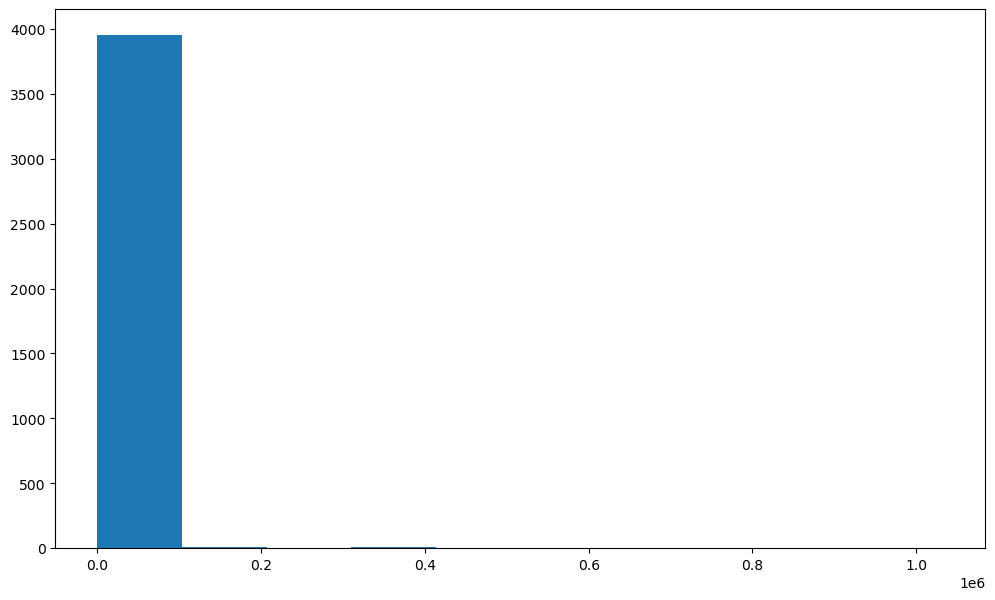

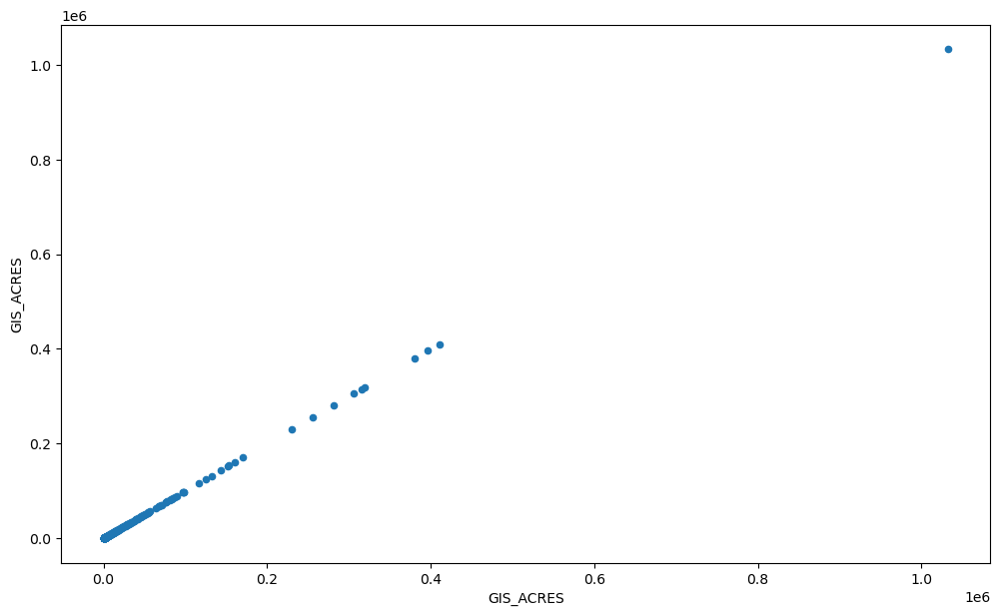

In [53]:
fire_df = df[df['GIS_ACRES'] > 0]

plt.figure(figsize=(12, 7))
plt.hist(fire_df['GIS_ACRES'])
fire_df.plot(kind='scatter', x='GIS_ACRES', y='GIS_ACRES', figsize=(12, 7));

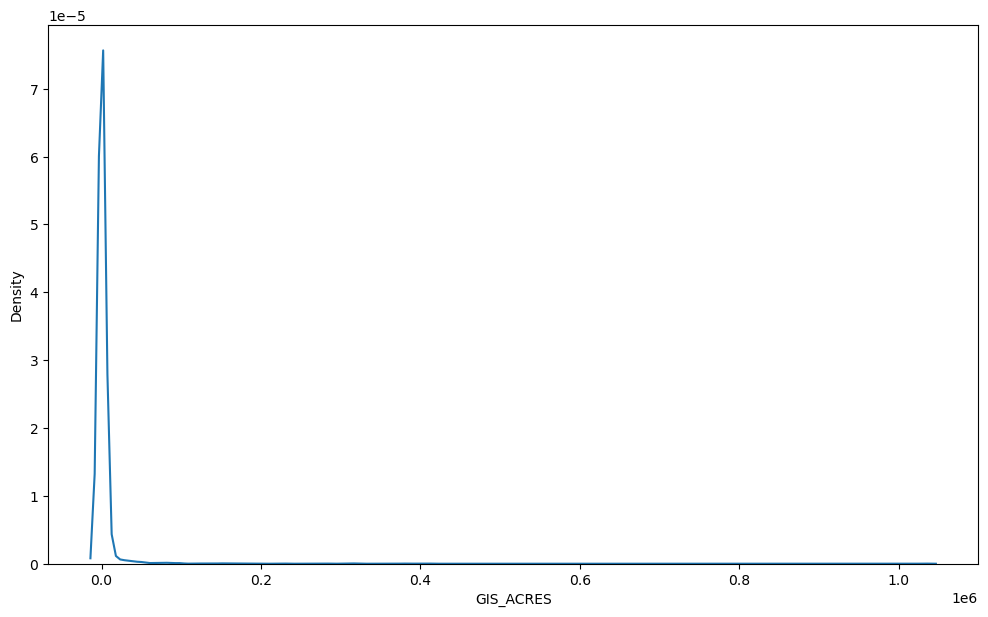

In [54]:
plt.figure(figsize=(12, 7))
sns.distplot(fire_df['GIS_ACRES'], hist=False,);

Looking at the three graphs depicting the distribution of the number of acres burned, we can see that most fires burn a smaller number of acres compared to the outliers we have. This means we should try and limit the upper bound of our data to remove the gigantic outliers we have in the GIS_ACRES we have.

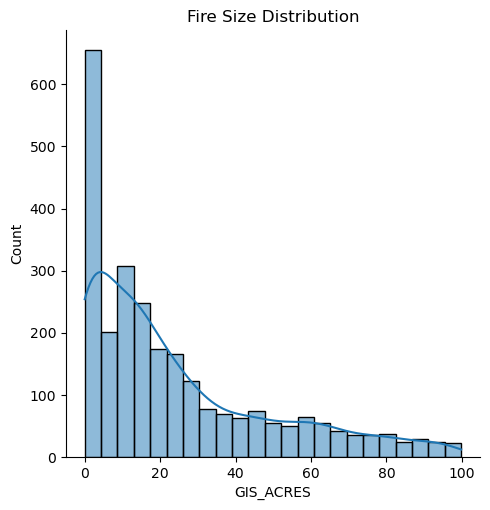

In [55]:
fig_1 = sns.displot(fire_df[fire_df['GIS_ACRES'] < 100]['GIS_ACRES'],
            kde=True,);
fig_1.set(title = "Fire Size Distribution");

As we can see, most fires that occurred in our data burned less than 100 acres. Going forward we shall bound our fire data to: 0 < GIS_ACRES < 100.

In [56]:
fire_df = fire_df[fire_df['GIS_ACRES'] < 100]
fire_df.describe()

,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,CAUSE,lat,long,GIS_ACRES
count,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000,2.624000e+03,2624.000000,2624.000000,2624.000000,2624.000000,2624.000000
mean,81.330914,53.973564,72.604849,0.017671,46.665333,5.187957,0.025802,61.737325,56.939250,2.756160e-01,12.463806,8.269055,37.059695,-120.105572,24.152576
std,11.763966,9.013811,11.026539,0.124869,13.073656,1.270393,0.051299,12.373971,14.901146,3.461555e-01,1.679422,5.286242,2.610631,1.978110,24.709823
min,35.178571,17.964286,28.250000,0.000000,12.766667,2.500000,0.000000,27.922427,13.887097,-8.326673e-17,6.822581,1.000000,33.020000,-123.980000,0.001515
25%,73.800000,48.838710,66.200000,0.000000,37.032258,4.366667,0.000000,52.934581,46.707527,4.537634e-02,11.473333,2.000000,34.360000,-121.340000,4.363766
50%,82.677419,54.000000,74.000000,0.000000,46.700000,4.935484,0.006452,60.799283,57.659498,1.425922e-01,12.503226,9.000000,36.610000,-120.040000,15.401242
75%,89.166667,59.935484,80.133333,0.000000,54.975806,5.800000,0.029032,71.012186,68.579781,3.518433e-01,14.083871,14.000000,39.270000,-118.730000,35.613159
max,108.451613,86.677419,102.064516,2.167894,87.354839,11.433333,0.483871,98.055914,93.598694,3.619931e+00,14.500000,19.000000,41.750000,-115.360000,99.837486


As we can see, our standard deviation of our GIS_ACRES had decreased dramatically after limiting our scope to fires that burned less than 100 acres. We manages to decrease it from 14785.95 to 24.71, giving us a much better distribution of our data.

Another thing we can look at is where the fires took place and how the are distributed on a map. Just looking at the latitude and longitude coordinates are hard to visualize on their own. But we can uses these value in conjunction with a python library called folium. folium is a library that will allow use to plot points on an interactive map. The map is stored in an html format.

When building the map, we can manipulate a few things to make reading the map easier. When we plot our points on the map, we can scale the size of the points in proportion to how many acres that fire burned. We can also add text to each point so that a user can get more information about a fire once they click on that point. NOTE: The map below has all the fires in the dataset despite how many acres the fire burned.

In [57]:
fire_map_data = df[df['GIS_ACRES'] > 0]

# Changing the cause of the fire from a number to it's corresponding cause.
cause_dict = {1: "Lightning",
              2: "Equipment Use",
              3: "Smoking",
              4: "Campfire",
              5: "Debris",
              6: "Railroad",
              7: "Arson",
              8: "Playing with Fire",
              9: "Miscellaneous",
              10: "Vehicle",
              11: "Powerline",
              12: "Firefighter Training",
              13: "None-Firefighter Training",
              14: "Unknown",
              15: "Structure",
              16: "Aircraft",
              18: "Escaped Prescribed Burn",
              19: "Illegal Alien Campfire"
}

fire_map_data['CAUSE'] = fire_map_data['CAUSE'].map(cause_dict)
fire_map_data.columns = map(str.lower, fire_map_data.columns)

# Setting Up Map Object.
fire_map = folium.Map(location=[37.50, -120.04], zoom_start=6)


# Adding Fires to Map.
for lat, long, cause, acres, date, name in zip(fire_map_data['lat'],
                                         fire_map_data['long'],
                                         fire_map_data['cause'],
                                         fire_map_data['gis_acres'],
                                         fire_map_data['date'],
                                         fire_map_data['fire_name']):
    folium.CircleMarker([lat, long],
                        radius=0.0001 * acres,
                        color = 'red',
                        fill_opacity=0.5,
                        fill=True,
                        popup=folium.Popup(f'<B>Fire Name:</B> {name.title()} <br>'
                                           f'<B>Fire Cause:</B> {cause} <br>'
                                           f'<B>Acres Burned:</B> {acres:.2f} <br>'
                                           f'<B>Date of Fire:</B> {date}',
                                           max_width=1000)
                         ).add_to(fire_map)

fire_map

Next we can look at some heatmaps to check and see if there any strong correlations between some of the variables. We will also look as some pairplot as well. For the pairplot we will be dividing them up into two set of plots: monthly and quarterly. The quarterly data was engineered from the monthly data.

-------------------------------------- Monthly Data Pairplots --------------------------------------


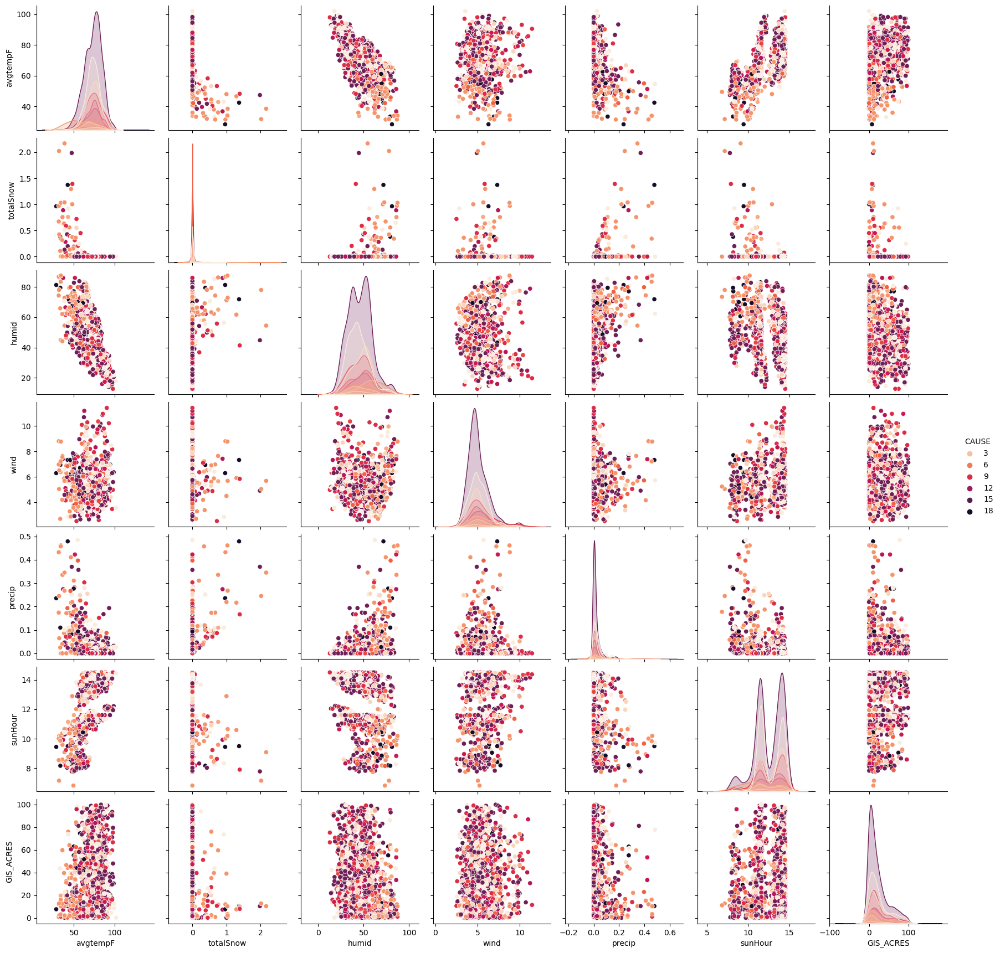

In [58]:
d_features = ['avgtempF', 'totalSnow', 'humid', 'wind', 'precip', 'sunHour', 'CAUSE', 'GIS_ACRES']
q_features = ['q_avgtempF', 'q_avghumid', 'q_sumprecip', 'wind', 'sunHour', 'CAUSE', 'GIS_ACRES']

# Pairplots
print(f" Monthly Data Pairplots ".center(100, '-'))
sns.pairplot(fire_df[d_features], hue="CAUSE", palette='rocket_r');

------------------------------------- Quarterly Data Pairplots -------------------------------------


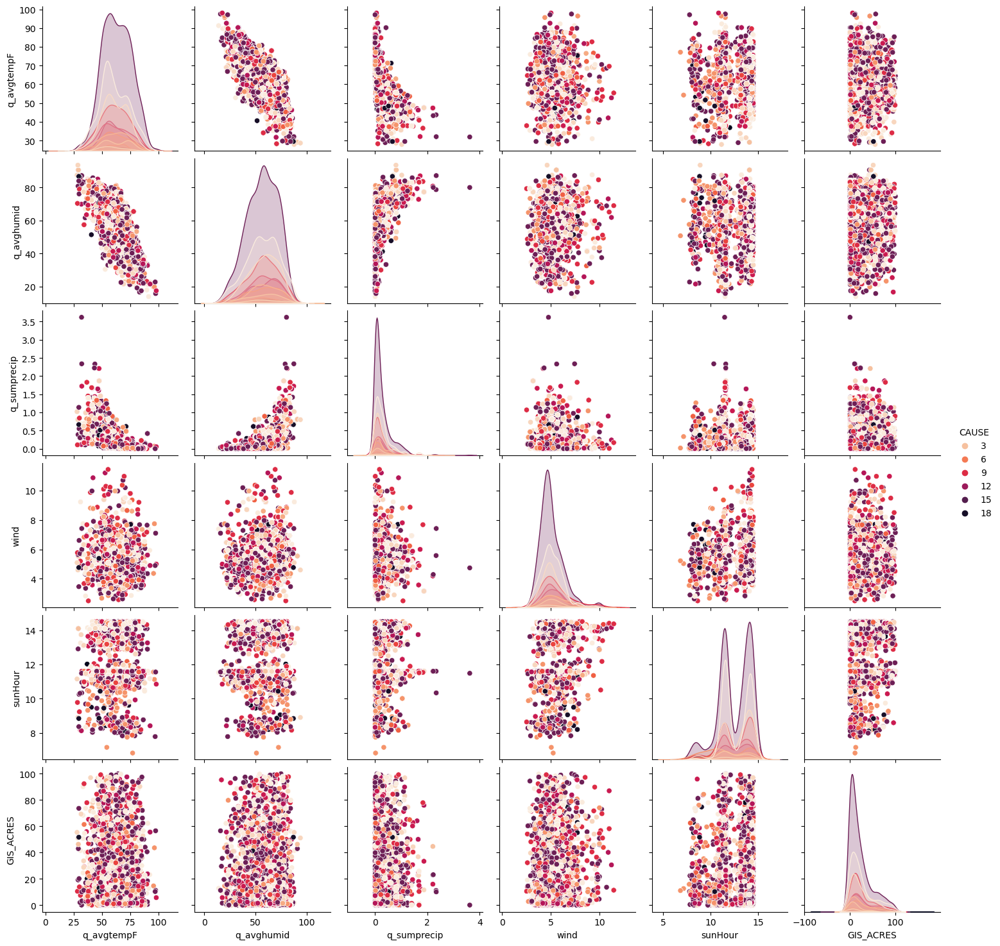

In [59]:
print(f" Quarterly Data Pairplots ".center(100, '-'))
sns.pairplot(fire_df[q_features], hue="CAUSE", palette='rocket_r');

In [63]:
fire_df.sort_values(by='GIS_ACRES', ascending=False)[['county', 'FIRE_NAME', 'GIS_ACRES']].head(10)

,county,FIRE_NAME,GIS_ACRES
1827,Riverside County,GILMAN,99.837486
7822,Shasta County,R-3 MUD,99.573639
9543,Santa Barbara County,RANGE,99.083054
2555,Riverside County,CABAZON,98.980995
4373,Napa County,HIGHLAND,98.822746
1378,Kern County,BRAMLETTE,98.147751
3369,Riverside County,FREEWAY,97.775436
6014,Lake County,DEER,97.552078
2455,Riverside County,CAHUILLA,97.545860
6020,Glenn County,36,97.439041


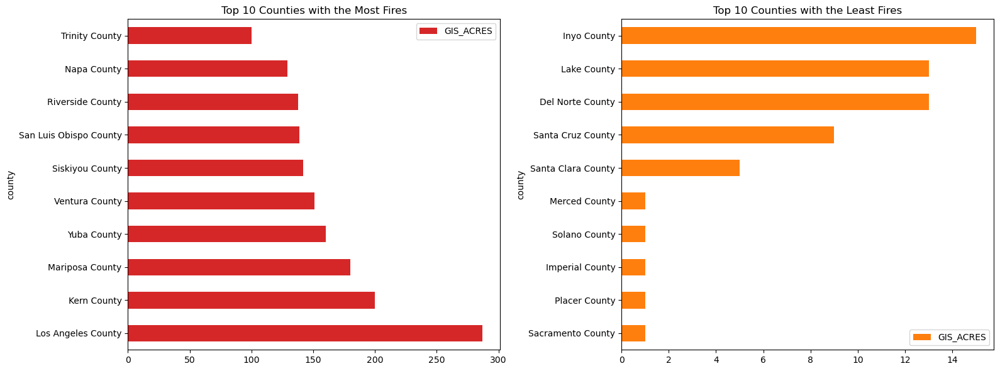

In [64]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6), tight_layout=True)

(fire_df[['county','GIS_ACRES']]
 .groupby('county')
 .count()
 .sort_values(by='GIS_ACRES', ascending=False)
 .head(10)
 .plot(kind='barh', title='Top 10 Counties with the Most Fires', color='tab:red', ax=axes[0]))

(fire_df[['county','GIS_ACRES']]
 .groupby('county')
 .count()
 .sort_values(by='GIS_ACRES')
 .head(10)
 .plot(kind='barh', title='Top 10 Counties with the Least Fires', color='tab:orange', ax=axes[1]));

Finally let's see which counties have the most fires and which have the least. As you can see Los Angeles County has the most amount of fires while Sacramento County has the least. This might be due to Los Angeles being the largest city in California. Because of that there are more people which means there is a higher chance fire will occur.

## Model Selection

In [66]:
# Load Clean Data

In [68]:
df = pd.read_csv('combined.csv')

In [69]:
df.head()

,date,county,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,q_avghumid,q_sumprecip,sunHour,FIRE_NAME,CAUSE,lat,long,GIS_ACRES
0,2008-07,Santa Barbara County,89.129032,59.709677,80.548387,0.0,41.451613,7.354839,0.0,72.937634,34.079570,0.010000,13.164516,no_fire,0.0,34.54,-120.04,0.000000
1,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,SERPENTINE,1.0,38.18,-120.56,176.763400
2,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,POOL 2 - MAIN,10.0,38.18,-120.56,73.444778
3,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,FRENCH,14.0,38.18,-120.56,101.074150
4,2008-07,Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,38.434409,0.068065,14.022581,EVANS,6.0,38.18,-120.56,103.968050


In [70]:
df = df.drop(columns=['FIRE_NAME', 'lat', 'long'])

In [71]:
df['bool'] = (df['GIS_ACRES'] > 0) * 1

In [72]:
df['date'] = [x.split('-') for x in df['date']]

In [73]:
df['year'] = [int(x[0]) for x in df['date']]

In [74]:
df['month'] = [int(x[1]) for x in df['date']]

In [75]:
df.shape

(10988, 18)

In [76]:
df_dummy = pd.get_dummies(df, columns=['month'])

In [77]:
df_dummy.head()

,date,county,maxtempF,mintempF,avgtempF,totalSnow,humid,wind,precip,q_avgtempF,...,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,"[2008, 07]",Santa Barbara County,89.129032,59.709677,80.548387,0.0,41.451613,7.354839,0.0,72.937634,...,False,False,False,False,True,False,False,False,False,False
1,"[2008, 07]",Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,...,False,False,False,False,True,False,False,False,False,False
2,"[2008, 07]",Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,...,False,False,False,False,True,False,False,False,False,False
3,"[2008, 07]",Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,...,False,False,False,False,True,False,False,False,False,False
4,"[2008, 07]",Calaveras County,96.419355,51.290323,87.032258,0.0,33.580645,5.387097,0.0,65.217204,...,False,False,False,False,True,False,False,False,False,False


In [78]:
df_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10988 entries, 0 to 10987
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         10988 non-null  object 
 1   county       10988 non-null  object 
 2   maxtempF     10988 non-null  float64
 3   mintempF     10988 non-null  float64
 4   avgtempF     10988 non-null  float64
 5   totalSnow    10988 non-null  float64
 6   humid        10988 non-null  float64
 7   wind         10988 non-null  float64
 8   precip       10988 non-null  float64
 9   q_avgtempF   10988 non-null  float64
 10  q_avghumid   10988 non-null  float64
 11  q_sumprecip  10988 non-null  float64
 12  sunHour      10988 non-null  float64
 13  CAUSE        10988 non-null  float64
 14  GIS_ACRES    10988 non-null  float64
 15  bool         10988 non-null  int32  
 16  year         10988 non-null  int64  
 17  month_1      10988 non-null  bool   
 18  month_2      10988 non-null  bool   
 19  mont

## Split the Dataset in X & y

In [79]:
X = df_dummy.drop(columns=['GIS_ACRES', 'date', 'q_avgtempF', 'q_avghumid', 'q_sumprecip', 'maxtempF', 'mintempF', 'CAUSE', 'bool', 'county'])
y = df_dummy['bool']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.3)

In [80]:
df['bool'].value_counts(normalize=True)

bool
0    0.638424
1    0.361576
Name: proportion, dtype: float64

## Logistic Regression

In [81]:
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)
print(log_reg.score(X_train, y_train))
log_reg.score(X_test, y_test)

0.7490573397477571


0.764634516226873

In [82]:
pd.set_option('display.max_row', None)

In [83]:
coef_df = pd.DataFrame(log_reg.coef_, columns=X.columns)
coef_df.T.sort_values(by=0, ascending=False).head(77)

,0
month_8,1.133897
month_11,0.583166
month_9,0.579219
sunHour,0.518545
month_7,0.318148
month_12,0.311827
month_10,0.125888
year,-0.001795
avgtempF,-0.005698
totalSnow,-0.008889


In [84]:
log_reg.coef_

array([[-0.00569796, -0.00888867, -0.02375396, -0.28076253, -0.25535466,
         0.51854478, -0.00179523, -0.57400927, -0.8103524 , -0.61266184,
        -0.46145007, -0.43530102, -0.17199698,  0.31814849,  1.13389667,
         0.57921934,  0.12588836,  0.58316553,  0.31182727]])

In [85]:
## Apply Standard Scaler

In [86]:
sc = StandardScaler()
X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.transform(X_test)

### KNN

In [87]:
knn = KNeighborsClassifier(n_neighbors=3, weights='distance')
knn.fit(X_train_sc, y_train)
print(knn.score(X_train_sc, y_train))
knn.score(X_test_sc, y_test)

0.9986997789624236


0.8495602062481044

### Random Forest

In [89]:
rf = RandomForestClassifier(n_estimators=150, max_depth=15)
rf.fit(X_train, y_train)
print(rf.score(X_train, y_train))
rf.score(X_test, y_test)

0.9810167728513848


0.8768577494692145

In [90]:
rf_preds = rf.predict(X_test)

In [91]:
rf.feature_importances_

array([0.22317485, 0.0153204 , 0.18187375, 0.13481421, 0.09326672,
       0.20435142, 0.06811053, 0.00299217, 0.00314471, 0.00301007,
       0.0055738 , 0.00766649, 0.00737655, 0.01824212, 0.00982206,
       0.00910849, 0.00631698, 0.0030306 , 0.00280408])

In [92]:
feature_df = pd.DataFrame(rf.feature_importances_, index=X.columns)
feature_df.sort_values(by=0, ascending=False)

,0
avgtempF,0.223175
sunHour,0.204351
humid,0.181874
wind,0.134814
precip,0.093267
year,0.068111
month_7,0.018242
totalSnow,0.015320
month_8,0.009822
month_9,0.009108


In [93]:
log_reg.predict(X_test)
knn.predict(X_test)
rf.predict(X_test)

array([1, 0, 0, ..., 0, 0, 0])

In [94]:
pred_df = pd.DataFrame(columns=['log_reg', 'knn', 'rf'])
pred_df['log_reg'] = log_reg.predict(X_test)
pred_df['knn'] = knn.predict(X_test)
pred_df['rf'] = rf.predict(X_test)
pred_df['ensemble'] = (pred_df.sum(axis=1)/3).round(0)
pred_df.head()

,log_reg,knn,rf,ensemble
0,1,0,1,1.0
1,0,0,0,0.0
2,0,0,0,0.0
3,1,0,1,1.0
4,0,0,0,0.0


In [95]:
metrics.accuracy_score(pred_df['ensemble'], y_test)

0.797391568092205

In [96]:
knn_pipe = Pipeline([
    ('sc', StandardScaler()),
    ('knn', KNeighborsClassifier(n_neighbors=3, weights='distance')),
])

vote = VotingClassifier([
    ('knn_pipe', knn_pipe),
    ('rf', RandomForestClassifier(n_estimators=150, max_depth=15)),
    ('ada', AdaBoostClassifier(n_estimators=150))
])

vote.fit(X_train, y_train)

VotingClassifier(estimators=[('knn_pipe',
                              Pipeline(steps=[('sc', StandardScaler()),
                                              ('knn',
                                               KNeighborsClassifier(n_neighbors=3,
                                                                    weights='distance'))])),
                             ('rf',
                              RandomForestClassifier(max_depth=15,
                                                     n_estimators=150)),
                             ('ada', AdaBoostClassifier(n_estimators=150))])

In [97]:
print(f"Train Score:\t{vote.score(X_train, y_train):.4f}")
print(f"Test Score:\t{vote.score(X_test, y_test):.4f}")

Train Score:	0.9831
Test Score:	0.8723


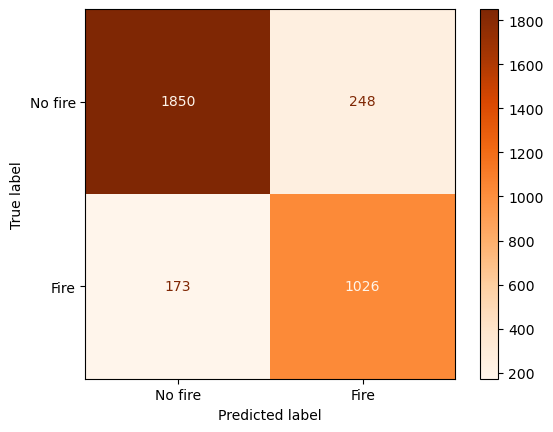

In [104]:
cm = confusion_matrix(y_test, vote.predict(X_test))
tn, fp, fn, tp = cm.ravel()
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No fire', 'Fire'])
disp.plot(cmap='Oranges')

In [105]:
vote_preds = vote.predict(X_test)

In [106]:
metrics.roc_auc_score(y_test, rf_preds)
print(metrics.recall_score(y_test, rf_preds))
print(metrics.precision_score(y_test, rf_preds))

0.8306922435362802
0.8306922435362802


In [107]:
metrics.roc_auc_score(y_test, vote_preds)
print(metrics.recall_score(y_test, vote_preds))
print(metrics.precision_score(y_test, vote_preds))

0.8557130942452044
0.8053375196232339


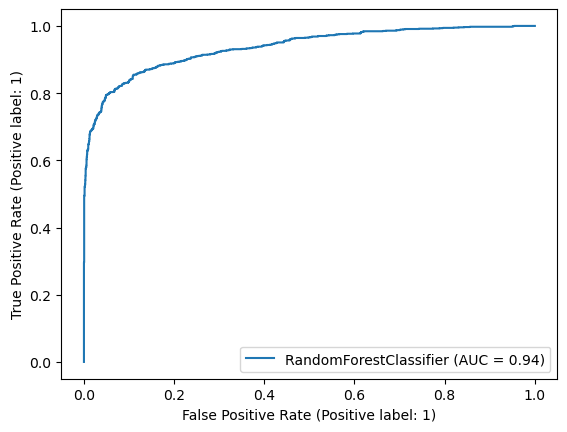

In [110]:
RocCurveDisplay.from_estimator(rf, X_test, y_test)

## Summarize findings

Based on our predictive models, we achieved significant success in forecasting potential fire occurrences. Our top-performing model, the Random Forest, demonstrated an accuracy of 88%, and our second-best model showcased an impressive recall score of 86%. Given the critical nature of wildfire prevention and the increasing threat posed by climate change, we recommend the adoption of the Random Forest model due to its high recall rate, meaning it is better at identifying fires. However, this model also produces more false positives, predicting some fires that may not actually occur.

The California Department of Forestry and Fire Protection must weigh the trade-offs between these models. If the priority is to ensure no potential fire goes unnoticed, the Random Forest model is ideal despite its higher rate of false alarms. This choice is suitable if there are ample resources to investigate these additional false positives.

On the other hand, if resources and manpower are limited, the Voting Classifier model may be more appropriate. It generates fewer false positives, thereby conserving resources, but it also carries the risk of missing some fires.

Ultimately, the decision hinges on the Department’s resource availability and strategic priorities. Balancing the need to minimize false alarms with the imperative to detect and mitigate all possible fires will determine the most suitable model for deployment.

## Model Performance
### Random Forest Model:

Accuracy: 88%
Recall: High
False Positives: High

The Random Forest model demonstrated strong overall accuracy and a high recall rate, indicating its effectiveness in identifying potential fires. However, it also predicted a significant number of false positives. This means while it successfully identifies most fires, it also often triggers alarms for events that don't materialize into actual fires.

#### Voting Classifier Model:

Accuracy: Slightly lower than Random Forest
Recall: 86%
False Positives: Lower than Random Forest

The Voting Classifier model, while slightly less accurate overall, produced fewer false positives compared to the Random Forest model. This model is less likely to generate false alarms, making it more conservative in its predictions.

## Business Implications

#### Resource Allocation and Efficiency:

##### Random Forest Model:
Using the Random Forest model requires the California Department of Forestry and Fire Protection to have substantial resources and manpower. The higher rate of false positives means that more time and effort will be spent investigating potential fires that turn out to be false alarms. This could strain resources, particularly during peak fire season, but ensures that fewer actual fires are missed.

##### Voting Classifier Model:
The Voting Classifier model, with its lower false positive rate, helps conserve resources by reducing the number of false alarms. This can lead to more efficient use of personnel and equipment, focusing efforts on more probable fire incidents. However, the trade-off is the potential risk of missing some fires, which could lead to uncontrolled fire outbreaks if not detected early.

## Risk Management:

##### Random Forest Model:
By adopting the Random Forest model, the Department can minimize the risk of undetected fires, aligning with a proactive approach to wildfire management. This model supports the strategy of erring on the side of caution, which is critical in high-risk areas and during severe fire weather conditions.

##### Voting Classifier Model:
The Voting Classifier model aligns with a more conservative risk management strategy, balancing the need to detect fires with the practicalities of resource limitations. This model is beneficial in scenarios where the cost of false alarms (in terms of resource allocation) is higher than the cost of potentially missing some fires.

### Operational Decision-Making:

##### Random Forest Model:
This model supports a more aggressive operational stance, where the focus is on ensuring no fire goes undetected. It demands robust logistics and operational support to handle the increased number of alerts and necessary follow-up actions.

##### Voting Classifier Model:
This model aids in making more calculated operational decisions, ensuring that the Department’s actions are more targeted and resource-efficient. It supports a strategy where the quality of alerts is prioritized over quantity, potentially leading to better overall resource management.

## Conclusion
The choice between the Random Forest model and the Voting Classifier model ultimately depends on the Department's strategic priorities and resource availability. The Random Forest model is suitable for scenarios where the cost of missing a fire is extremely high, and resources are ample. Conversely, the Voting Classifier model is ideal for scenarios where resources are limited, and the efficiency of each alert is paramount. By carefully evaluating these factors, the California Department of Forestry and Fire Protection can make an informed decision that best aligns with its operational capabilities and strategic goals.